Reanalysis of [No evidence for correlations between handgrip strength and sexually dimorphic acoustic properties of voices](https://www.biorxiv.org/content/early/2017/11/30/227165).  
Data and R code see https://osf.io/na2sb/

## Environment setups

In [1]:
import os

import numpy as np
import pandas as pd
import seaborn as sns
import pymc3 as pm
import theano.tensor as tt

%pylab inline
%config InlineBackend.figure_format = 'retina'
%load_ext watermark

plt.style.use('ggplot')

Populating the interactive namespace from numpy and matplotlib


In [2]:
%watermark -v -m -p numpy,pandas,seaborn,pymc3,matplotlib

CPython 3.5.2
IPython 6.2.1

numpy 1.13.3
pandas 0.21.0
seaborn 0.8.1
pymc3 3.2
matplotlib 2.1.0+224.g95805d2

compiler   : GCC 5.4.0 20160609
system     : Linux
release    : 4.4.0-101-generic
machine    : x86_64
processor  : x86_64
CPU cores  : 8
interpreter: 64bit


## Load data, display descriptive result
I resaved the data into csv format

In [3]:
tbl = pd.read_csv('final_dataset.csv', ',')
tbl.head()

,ID,sex,age,ethnicity,HGS,F0,F0SD,Df_Puts,Pf_Puts,VTL_Reby
0,4,male,19.0,Chinese,45.5,114.5832,14.0137,996.500000,-0.175121,15.923498
1,7,male,27.0,Chinese,31.0,147.4819,15.3037,981.033333,0.142022,15.779474
2,8,male,24.1,Chinese,40.0,123.3256,12.6864,977.000000,-0.781828,16.824111
3,19,male,22.5,Chinese,37.0,120.1835,12.5944,1036.966667,-0.375867,15.858461
4,21,male,20.1,Chinese,45.0,94.6771,27.3972,892.500000,-1.741636,18.364027


The main variables is handgrip strength (HGS) and acoustic properties of voices.

In [4]:
(tbl[['age', 'HGS', 'F0', 'F0SD', 'Df_Puts',
       'Pf_Puts', 'VTL_Reby']]
 .agg(['count', 'mean', 'std'])).T.round(3)

,count,mean,std
age,221.0,23.401,4.358
HGS,221.0,32.636,10.652
F0,221.0,166.269,55.524
F0SD,221.0,27.450,19.599
Df_Puts,221.0,1069.641,84.829
Pf_Puts,221.0,0.000,0.947
VTL_Reby,221.0,15.678,1.254


In [5]:
(tbl.groupby(['ethnicity', 'sex'])['age']
 .agg(['count'])).T.round(3)

ethnicity Chinese      White_UK     
sex        female male   female male
count          53   53       57   58

Descriptive data summary and display

In [6]:
def btCI(x):
    return sns.utils.ci(sns.algorithms.bootstrap(x, n_boot=1000))
def btCI_025(x):
    return btCI(x)[0]
def btCI_975(x):
    return btCI(x)[1]

In [7]:
(tbl.groupby(['ethnicity', 'sex'])[['age', 'HGS', 'F0', 'F0SD', 'Df_Puts',
       'Pf_Puts', 'VTL_Reby']]
 .agg(['mean', btCI_025, btCI_975, 'std'])).T.round(3)

ethnicity           Chinese            White_UK          
sex                  female      male    female      male
age      mean        24.104    24.843    21.830    22.986
         btCI_025    23.398    23.758    20.960    21.610
         btCI_975    24.845    26.040    22.746    24.482
         std          2.699     4.384     3.539     5.636
HGS      mean        23.566    41.170    24.939    40.690
         btCI_025    22.500    39.197    23.702    38.578
         btCI_975    24.557    43.482    26.158    42.923
         std          3.730     8.040     4.579     8.729
F0       mean       220.627   119.640   216.570   109.773
         btCI_025   215.005   115.735   211.710   105.624
         btCI_975   226.743   123.207   221.983   113.934
         std         21.884    14.758    21.067    16.747
F0SD     mean        40.028    13.146    43.134    13.614
         btCI_025    35.609    11.936    38.316    11.997
         btCI_975    44.791    14.456    47.946    15.270
         std         17.429     4.707    19.273     6.495
Df_Puts  mean      1141.819   995.988  1144.691   997.233
         btCI_025  1131.739   981.946  1133.819   987.581
         btCI_975  1151.712  1009.195  1155.181  1007.653
         std         36.814    51.130    42.537    38.974
Pf_Puts  mean         0.805    -0.805     0.843    -0.828
         btCI_025     0.687    -0.961     0.721    -0.938
         btCI_975     0.936    -0.668     0.961    -0.721
         std          0.448     0.551     0.468     0.411
VTL_Reby mean        14.473    16.657    14.674    16.872
         btCI_025    14.344    16.423    14.548    16.739
         btCI_975    14.598    16.928    14.792    17.005
         std          0.448     0.864     0.485     0.524

In [6]:
tbl['subgroup'] = tbl['ethnicity']+'-'+tbl['sex']

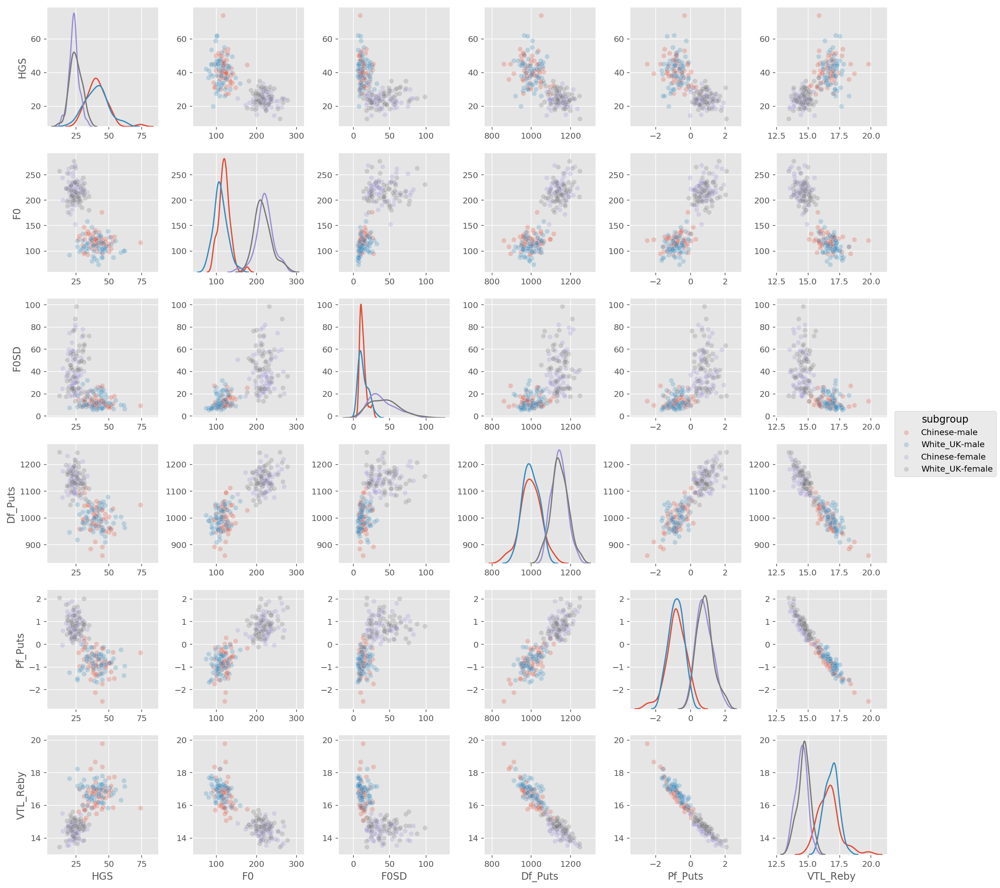

In [7]:
sns.pairplot(tbl, hue='subgroup', 
             vars=['HGS', 'F0', 'F0SD', 'Df_Puts', 'Pf_Puts', 'VTL_Reby'],
             diag_kind='kde',
             plot_kws=dict(alpha=.25));

## Mutivariate Model
In the original preprint, 5 different linear regressions are fitted. However, doing so igored the repeated measure (i.e., the five measurements from one row are taken from a same subject). An alternative approach is to model the 5 measurements as a multivariate, so the correlations between each measurement are accounted for.

In [8]:
from patsy import dmatrices
_, X  = dmatrices("HGS ~ ethnicity*sex", data=tbl, return_type='matrix')
Terms = X.design_info.column_names
X = np.asarray(X) # design matrix
datamat = tbl[['HGS', 'F0', 'F0SD', 'Df_Puts', 'Pf_Puts', 'VTL_Reby']].values # data
nsbj, npredi = X.shape
Nmeasure = datamat.shape[1]
Terms

['Intercept',
 'ethnicity[T.White_UK]',
 'sex[T.male]',
 'ethnicity[T.White_UK]:sex[T.male]']

### Non-centered parameterization
$$
\begin{align*}
R &
\sim \text{LKJCorr}(2)\\
\sigma &
\sim \text{HalfNormal}(50)\\
\text{Prior for coefficients}\\
\beta &
\sim \text{Normal}(0, 100)\\
cov &
= diag(\sigma)*R*diag(\sigma)\\
\mu_{latent} &
\sim \text{MvNormal}(X\beta, cov)\\
observed &
\sim \text{Normal}(\mu_{latent}, \sigma)
\end{align*}
$$

In [9]:
with pm.Model() as mv_model1:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(50)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=2, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    beta = pm.Normal('beta', mu=0., sd=100., shape=(npredi, Nmeasure))
    mu_ = pm.Normal('mu_', mu=0., sd=1., shape=datamat.shape)
    mu_group = tt.dot(X, beta) + tt.dot(chol, mu_.T).T
    
    # sd = pm.HalfNormal('sd', 5, shape=Nmeasure)
    
    # observed
    obs = pm.Normal('observed', mu=mu_group, sd=sd, observed=datamat)
    
    trace1 = pm.sample(1000, tune=2000,
                       #nuts_kwargs=dict(target_accept=.95, max_treedepth=15)
                      )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
 10%|▉         | 290/3000 [00:02<00:23, 114.21it/s]INFO (theano.gof.compilelock): Waiting for existing lock by process '7418' (I am process '7419')
INFO (theano.gof.compilelock): To manually release the lock, delete /home/laoj/.theano/compiledir_Linux-4.4--generic-x86_64-with-Ubuntu-16.04-xenial-x86_64-3.5.2-64/lock_dir
100%|██████████| 3000/3000 [01:33<00:00, 32.11it/s]


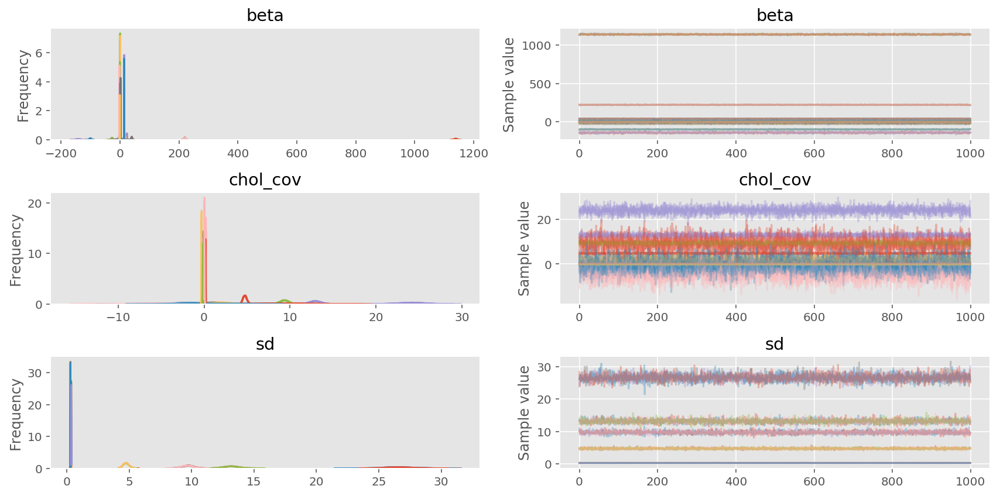

In [10]:
pm.traceplot(trace1, varnames=['beta', 'chol_cov', 'sd']);

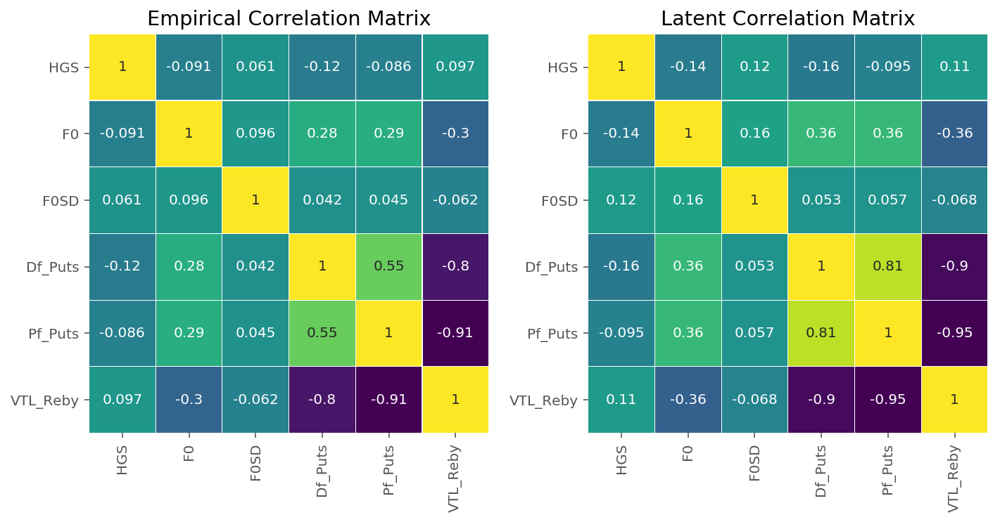

In [11]:
measure_labels = ['HGS', 'F0', 'F0SD', 'Df_Puts', 'Pf_Puts', 'VTL_Reby']

_, ax = plt.subplots(1, 2, figsize=(10, 5))

data_demean = np.zeros_like(datamat)
for ig in tbl['subgroup'].unique():
    data_demean[tbl['subgroup']==ig, :] = datamat[tbl['subgroup']==ig, :] - \
                                datamat[tbl['subgroup']==ig, :].mean(axis=0)

empirical_corr = pd.DataFrame(np.corrcoef(data_demean.T),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace1['corr'].mean(axis=0),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

### Posterior distribution of the cross correlation
Similar conclusion to the paper could be drawn: the posterior distributions of the correlations overlap with zero.

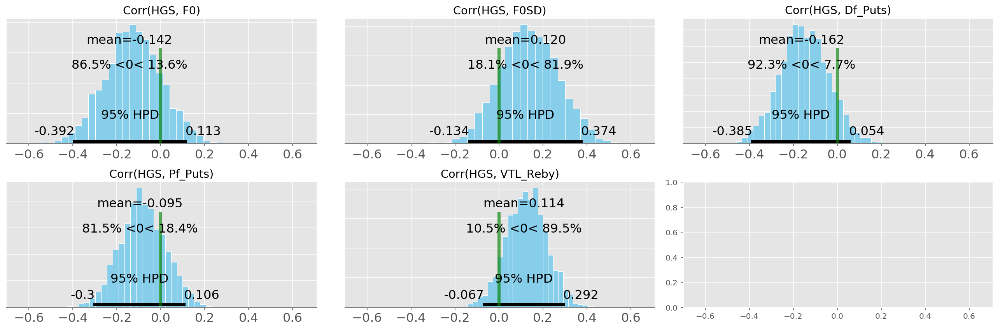

In [12]:
plotpost = pm.plots.artists.plot_posterior_op

_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = trace1['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', 
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

### Check model fit by ploting the posterior prediction with the actual observed

In [13]:
ppc1 = pm.sample_ppc(trace1, model=mv_model1, samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]


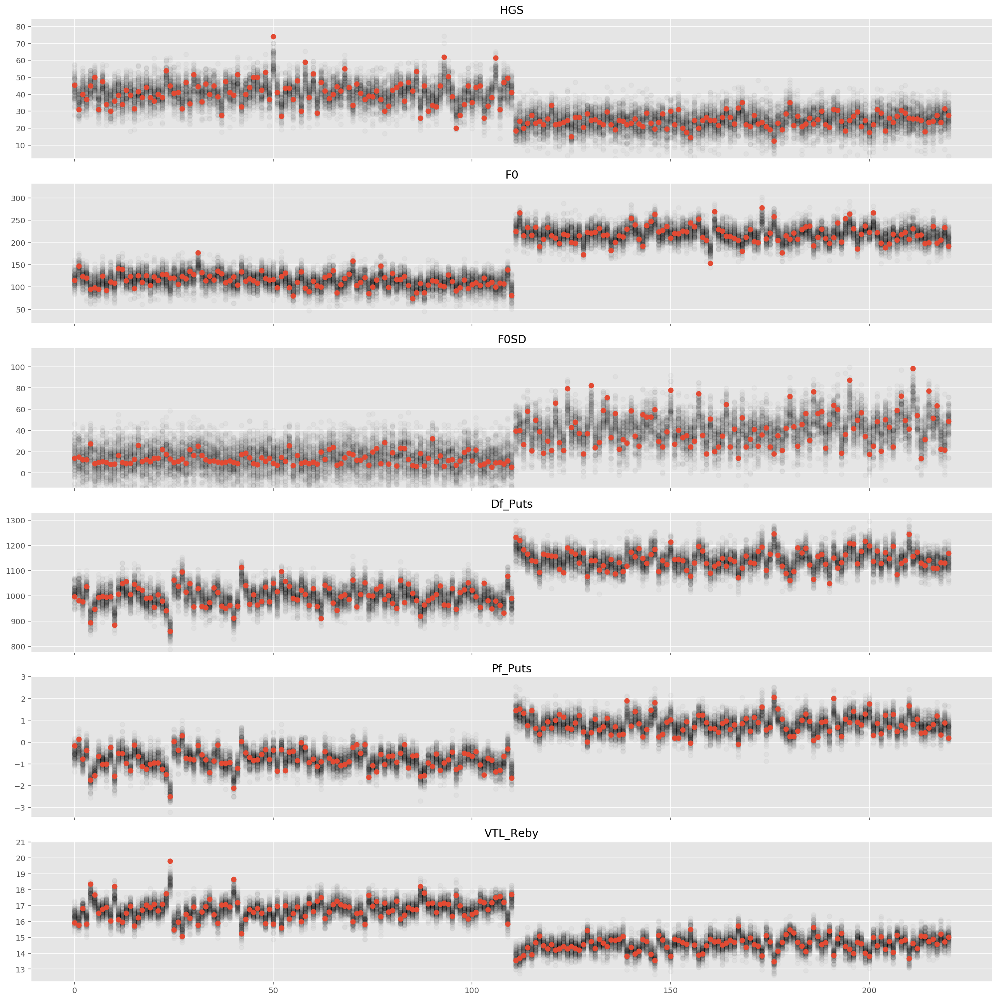

In [14]:
_, ax = plt.subplots(Nmeasure, 1, figsize=(18, 18), sharex=True)
for i in range(Nmeasure):
    ax[i].plot(ppc1['observed'][:,:,i].T, 'o', color='k', alpha=.025)
    ax[i].plot(datamat[:,i].T, 'o')
    ax[i].set_title(measure_labels[i])
    ax[i].set_ylim(datamat[:,i].min()-np.std(datamat[:,i]),
                   datamat[:,i].max()+np.std(datamat[:,i]))
plt.tight_layout();

In [ ]:
CONVERGENCE_TITLE = lambda: 'BFMI = {a:.2f}\nmax(R_hat) = {b:.3f}\nmin(Eff_n) = {c:.3f}'\
                    .format(a=bfmi, b=max_gr, c=min_effn)
def get_diags(trace):
    bfmi = pm.bfmi(trace)
    max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace).values())
    min_effn = min(np.min(ef_stats) for ef_stats in pm.effective_n(trace).values())
    return bfmi, max_gr, min_effn

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))

bfmi, max_gr, min_effn = get_diags(trace1)
(pm.energyplot(trace1, ax=ax)
   .set_title(CONVERGENCE_TITLE()));

### Centered parameterization
Another parameterization of the same above model

In [15]:
X1 = {c:(tbl[c]
        .replace(dict(zip(tbl[c].unique(), np.arange(len(tbl[c].unique())))))
        .values) 
     for c in ['subgroup', 'ethnicity', 'sex']}

In [16]:
X1['subgroup']

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

In [17]:
Ng = len(np.unique(X1['subgroup']))
with pm.Model() as mv_model2:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(50)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=2, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    mu = pm.Normal('mu', mu=datamat.mean(axis=0), sd=100., shape=(Ng, Nmeasure))
    mu_ = pm.Normal('mu_', mu=0., sd=1., shape=datamat.shape)
    mu_group = mu[X1['subgroup'], :] + tt.dot(chol, mu_.T).T
    
    # sd = pm.HalfNormal('sd', 5, shape=Nmeasure)
    
    # observed
    obs = pm.Normal('observed', mu=mu_group, sd=sd, observed=datamat)

In [18]:
with mv_model2:
    trace2 = pm.sample(1000, tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 3000/3000 [00:28<00:00, 105.59it/s]


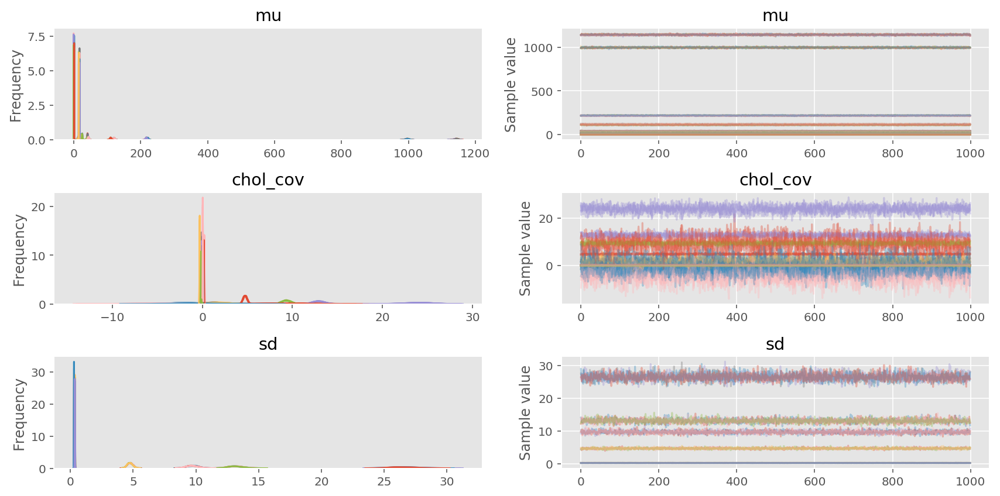

In [19]:
pm.traceplot(trace2, varnames=['mu', 'chol_cov', 'sd']);

In [20]:
pm.summary(trace2, varnames=['mu', 'chol_cov', 'sd']).round(3)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
mu__0_0,41.185,0.900,0.018,39.460,42.918,2604.0,1.001
mu__0_1,119.718,2.594,0.056,114.651,124.669,2634.0,1.000
mu__0_2,13.189,1.892,0.035,9.449,16.762,2939.0,1.000
mu__0_3,996.205,5.293,0.105,985.456,1006.294,2289.0,1.001
mu__0_4,-0.803,0.056,0.001,-0.918,-0.702,2277.0,1.001
mu__0_5,16.656,0.069,0.001,16.523,16.791,2364.0,1.000
mu__1_0,40.697,0.892,0.016,38.870,42.373,2622.0,1.000
mu__1_1,109.844,2.432,0.047,104.978,114.536,2754.0,1.000
mu__1_2,13.675,1.795,0.035,10.207,17.261,2777.0,1.000
mu__1_3,997.437,5.013,0.107,987.989,1007.873,2276.0,1.000


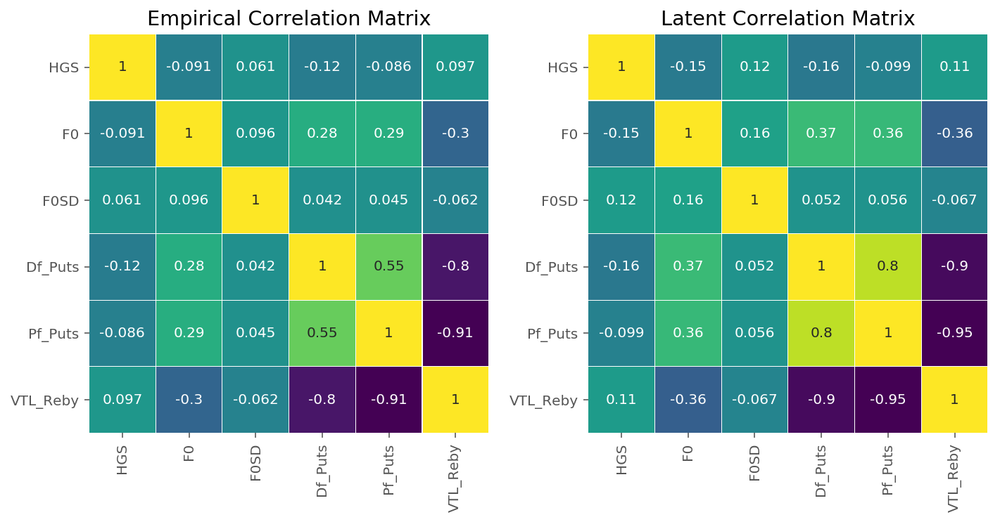

In [21]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace2['corr'].mean(axis=0),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

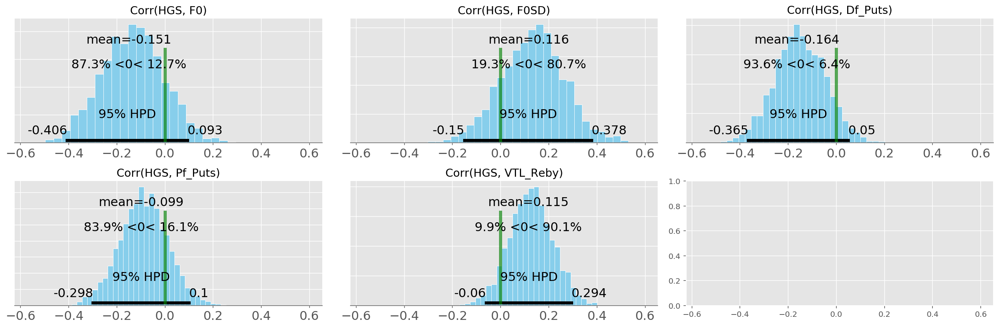

In [22]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = trace2['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', 
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

In [23]:
ppc2 = pm.sample_ppc(trace2, model=mv_model2, samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]


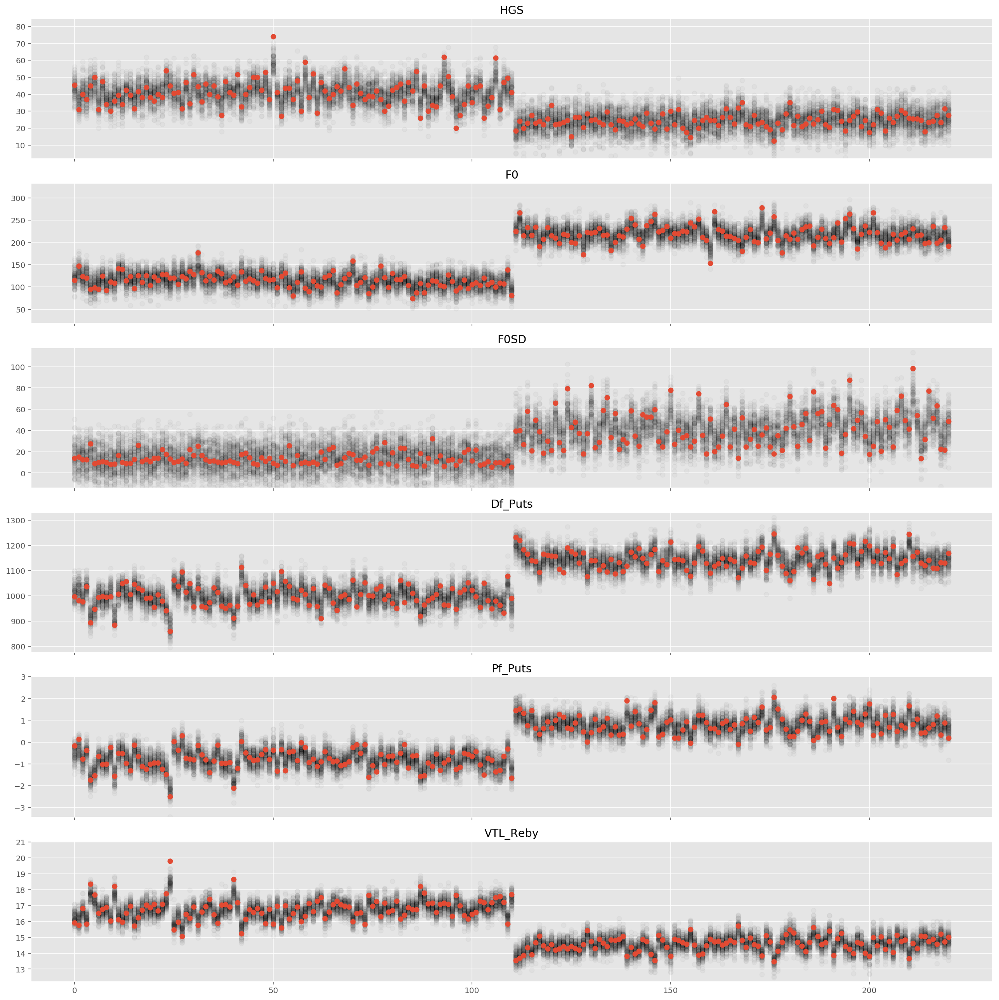

In [24]:
_, ax = plt.subplots(Nmeasure, 1, figsize=(18, 18), sharex=True)
for i in range(Nmeasure):
    ax[i].plot(ppc2['observed'][:,:,i].T, 'o', color='k', alpha=.025)
    ax[i].plot(datamat[:,i].T, 'o')
    ax[i].set_title(measure_labels[i])
    ax[i].set_ylim(datamat[:,i].min()-np.std(datamat[:,i]),
                   datamat[:,i].max()+np.std(datamat[:,i]))
plt.tight_layout();

## Compare models

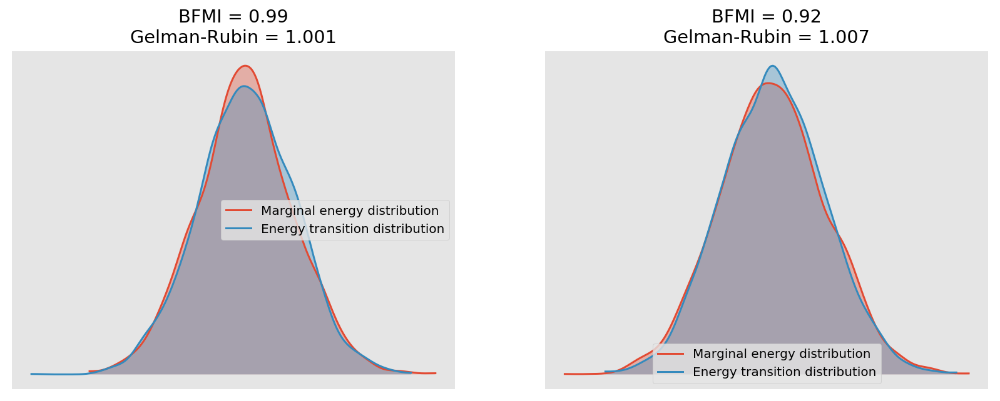

In [25]:
CONVERGENCE_TITLE = lambda: 'BFMI = {a:.2f}\nGelman-Rubin = {b:.3f}'.format(a=bfmi, b=max_gr)

_, ax = plt.subplots(1, 2, figsize=(14, 5))

bfmi = pm.bfmi(trace1)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace1).values())
(pm.energyplot(trace1, ax=ax[0])
   .set_title(CONVERGENCE_TITLE()));

bfmi = pm.bfmi(trace2)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace2).values())
(pm.energyplot(trace2, ax=ax[1])
   .set_title(CONVERGENCE_TITLE()));

In [26]:
MODEL_NAME_MAP = {
    0: "model1",
    1: "model2"
}

comp_df = (pm.compare([trace1, trace2], 
                      [mv_model1, mv_model2],
                      ic='LOO')
             .rename(index=MODEL_NAME_MAP)
             .loc[MODEL_NAME_MAP.values()])

comp_df

,LOO,pLOO,dLOO,weight,SE,dSE,warning
model1,7513.57,449.01,0,0.83,149.29,0,1
model2,7518.69,452.38,5.13,0.17,149.59,5.74,1


The two parameterization is pretty much identical

### Centered parameterization with robust option
Observing from the result above, it seems some of the observation (i.e., red dots) are outside of the gray area (i.e., predicted value using posterior prediction check). Maybe modeling the observed using a student-T distribution would be more robust and taken these value into account.

In [27]:
with pm.Model() as mv_model2r:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(50)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=2, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    mu = pm.Normal('mu', mu=datamat.mean(axis=0), sd=100., shape=(Ng, Nmeasure))
    mu_ = pm.Normal('mu_', mu=0., sd=1., shape=datamat.shape)
    mu_group = mu[X1['subgroup'], :] + tt.dot(chol, mu_.T).T
    
    # define prior for Student T degrees of freedom
    nu = pm.HalfNormal('nu', 10., shape=Nmeasure)

    # Likelihood (robust to outliner using t-distribution)
    obs = pm.StudentT('observed', mu=mu_group, sd=sd, nu=nu, observed=datamat)

    trace2r = pm.sample(1000, tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
100%|██████████| 3000/3000 [00:35<00:00, 85.57it/s]


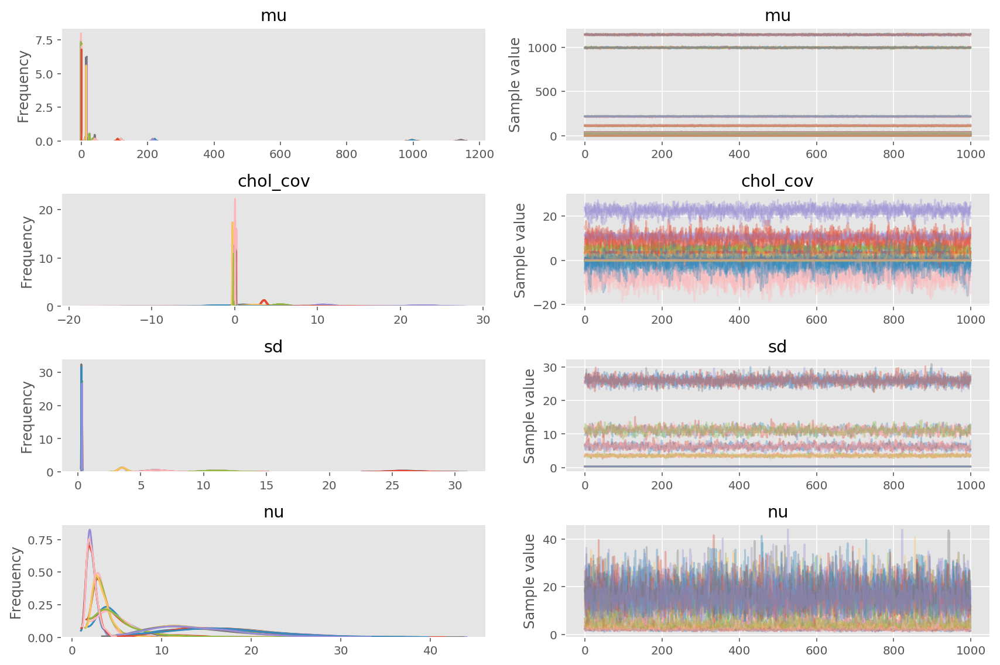

In [28]:
pm.traceplot(trace2r, varnames=['mu', 'chol_cov', 'sd', 'nu']);

In [29]:
pm.summary(trace2r, varnames=['mu', 'chol_cov', 'sd']).round(3)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
mu__0_0,40.468,0.872,0.016,38.918,42.314,2557.0,1.001
mu__0_1,119.321,2.350,0.049,114.506,123.643,2177.0,1.001
mu__0_2,12.882,1.304,0.024,10.356,15.429,2775.0,1.001
mu__0_3,996.201,5.192,0.114,986.154,1006.580,2037.0,1.000
mu__0_4,-0.802,0.055,0.001,-0.913,-0.698,2109.0,1.000
mu__0_5,16.623,0.070,0.002,16.483,16.753,2020.0,1.000
mu__1_0,40.533,0.880,0.019,38.804,42.229,2392.0,1.000
mu__1_1,109.553,2.275,0.040,105.098,113.780,2650.0,1.002
mu__1_2,13.283,1.265,0.022,10.888,15.937,2761.0,1.000
mu__1_3,997.211,4.999,0.107,987.151,1006.679,2129.0,1.001


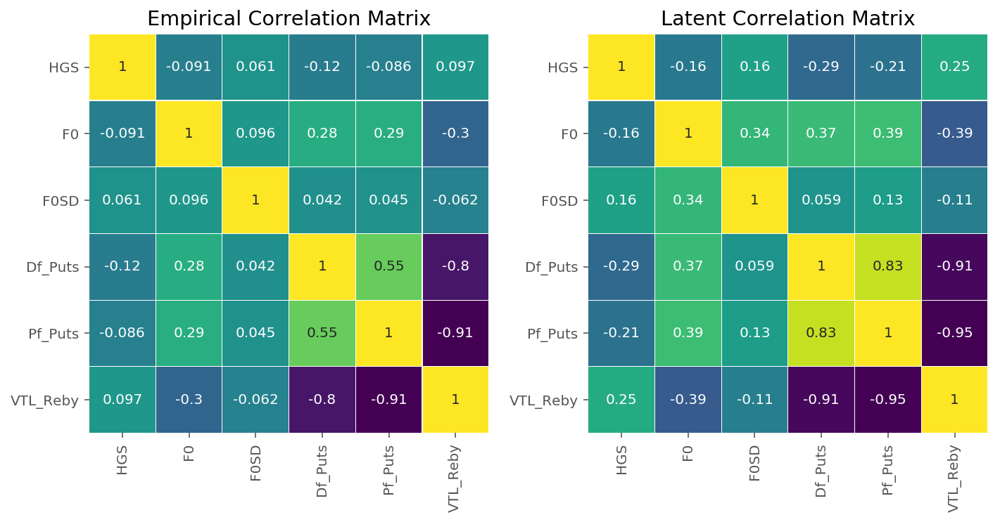

In [30]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace2r['corr'].mean(axis=0),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

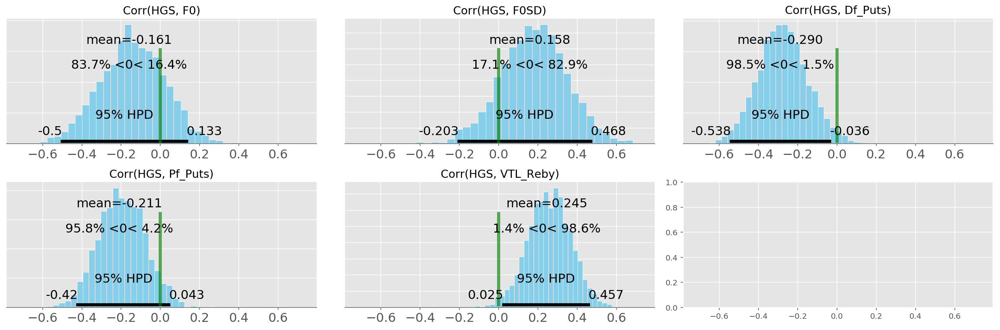

In [31]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = trace2r['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', 
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

In [32]:
ppc2r = pm.sample_ppc(trace2r, model=mv_model2r, samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]


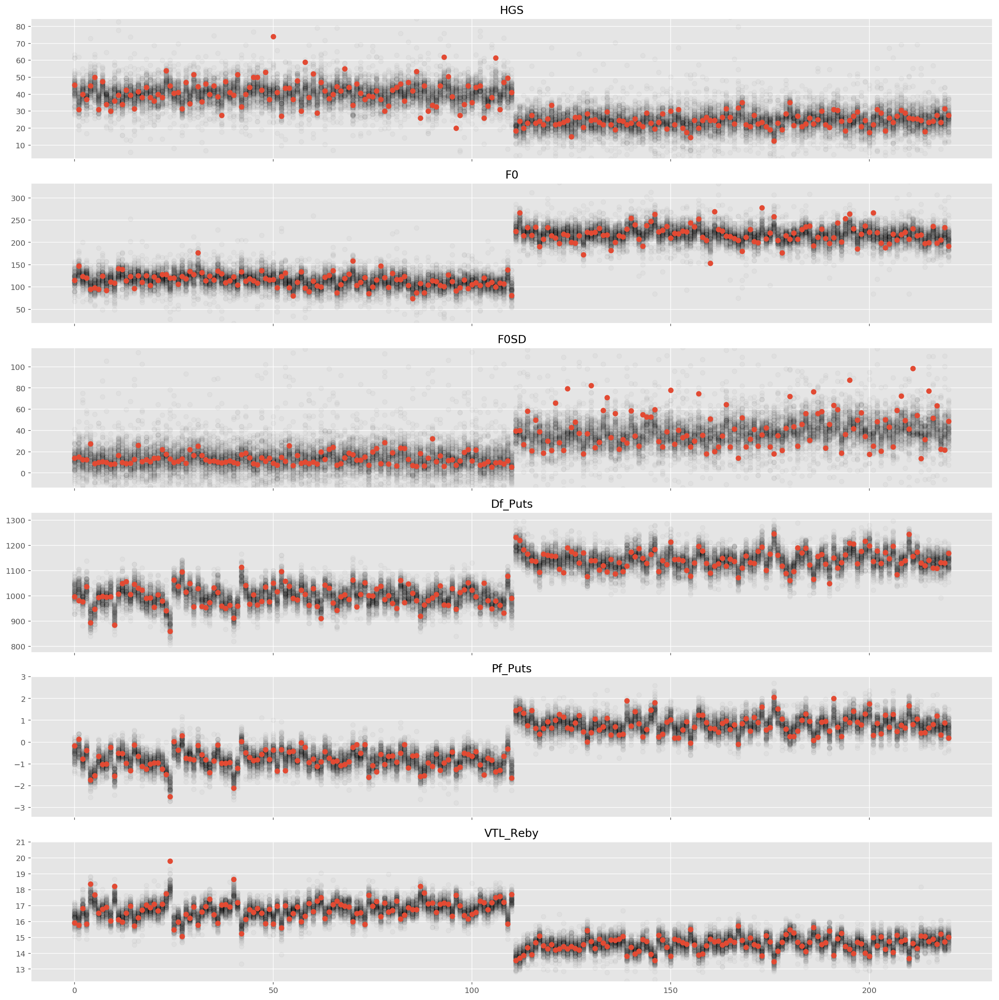

In [33]:
_, ax = plt.subplots(Nmeasure, 1, figsize=(18, 18), sharex=True)
for i in range(Nmeasure):
    ax[i].plot(ppc2r['observed'][:,:,i].T, 'o', color='k', alpha=.025)
    ax[i].plot(datamat[:,i].T, 'o')
    ax[i].set_title(measure_labels[i])
    ax[i].set_ylim(datamat[:,i].min()-np.std(datamat[:,i]),
                   datamat[:,i].max()+np.std(datamat[:,i]))
plt.tight_layout();

## Compare models

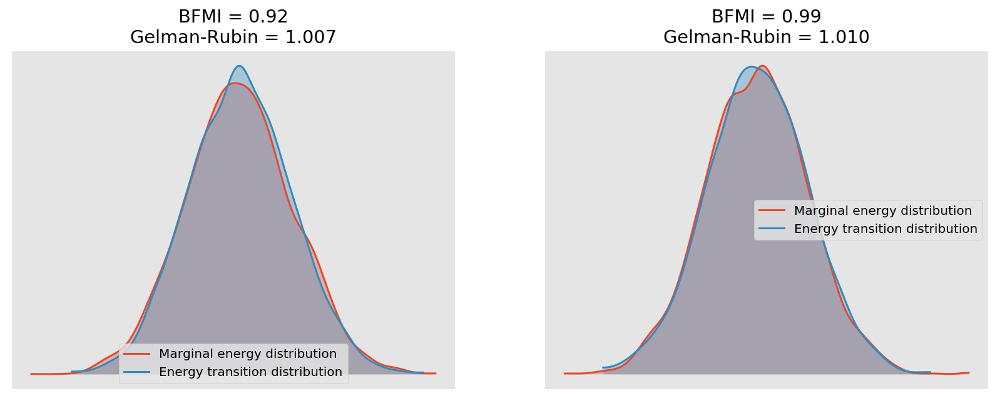

In [34]:
_, ax = plt.subplots(1, 2, figsize=(14, 5))

bfmi = pm.bfmi(trace2)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace2).values())
(pm.energyplot(trace2, ax=ax[0])
   .set_title(CONVERGENCE_TITLE()));

bfmi = pm.bfmi(trace2r)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace2r).values())
(pm.energyplot(trace2r, ax=ax[1])
   .set_title(CONVERGENCE_TITLE()));

In [36]:
MODEL_NAME_MAP = {
    0: "model1",
    1: "model2",
    2: "model2r"
}

comp_df = (pm.compare([trace1, trace2, trace2r], 
                      [mv_model1, mv_model2, mv_model2r],
                      ic='LOO')
             .rename(index=MODEL_NAME_MAP)
             .loc[MODEL_NAME_MAP.values()])

comp_df

,LOO,pLOO,dLOO,weight,SE,dSE,warning
model1,7513.57,449.01,0,0.58,149.29,0,1
model2,7518.69,452.38,5.13,0.01,149.59,5.74,1
model2r,7523.29,418.54,9.73,0.41,149.2,20.62,1


As shown from the posterior predictive check and the LOO model comparison, adding a robust option for potential outliner do not improve the model.

## Compare with a bootstrap distribution from a frequentist estimator

In [58]:
nboot = 4000
corr_boot = np.zeros_like(trace1['corr'])
for ib in range(nboot):
    boot_idx = np.random.choice(nsbj, nsbj)
    corr_boot[ib, :, :] = np.corrcoef(data_demean[boot_idx, :].T)

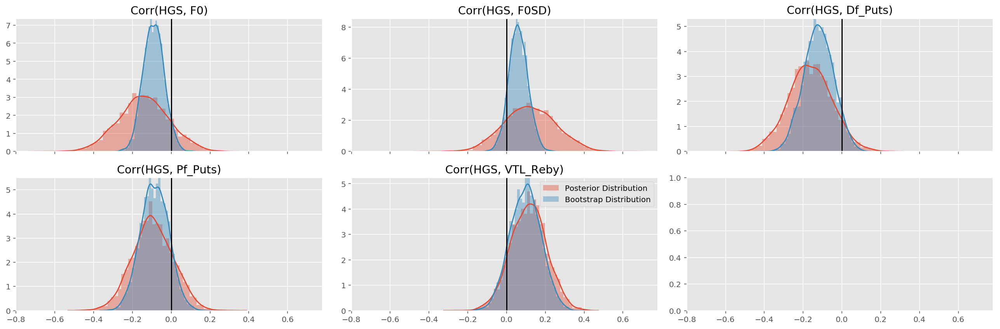

In [59]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        val1 = trace1['corr'][:, 0, i]
        sns.distplot(val1, kde=True, ax=ax1[i-1],
                         label='Posterior Distribution')
        val2 = corr_boot[:, 0, i]
        sns.distplot(val2, kde=True, ax=ax1[i-1],
                         label='Bootstrap Distribution')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
        ax1[i-1].axvline(0, color='k')
ax1[i-1].legend()
plt.tight_layout();

# Model on z-scored space

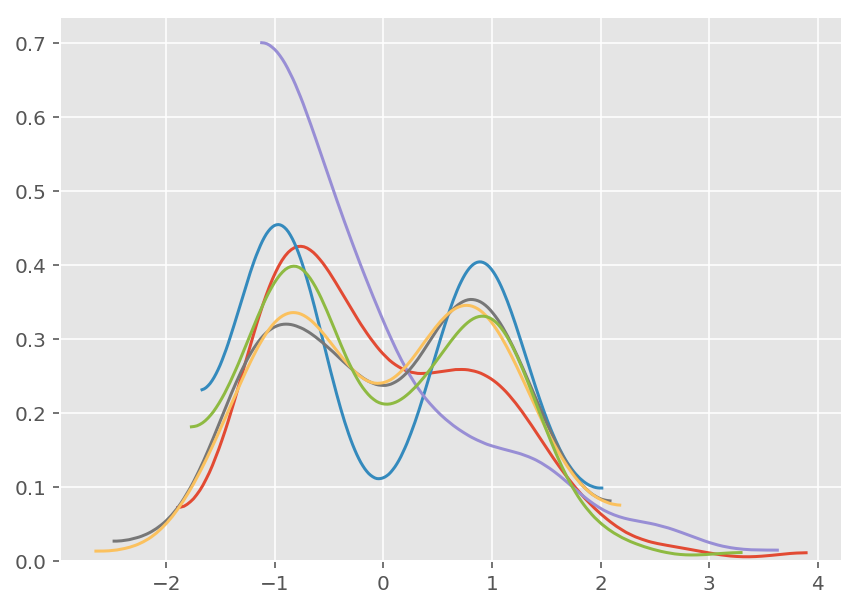

In [23]:
datamat_z = (datamat-datamat.mean(axis=0, keepdims=True))/datamat.std(axis=0, keepdims=True)
_, ax = plt.subplots(1, 1, figsize=(7, 5))
for i in range(datamat_z.shape[1]):
    pm.plots.kdeplot(datamat_z.T[i], ax=ax);

In [24]:
with pm.Model() as mv_modelz:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(5)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=1, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    beta = pm.Normal('beta', mu=0., sd=1., shape=(npredi, Nmeasure))
    # observed
    obs = pm.MvNormal('observed', 
                      mu=tt.dot(X, beta),
                      chol=chol, 
                      observed=datamat_z)
    
    tracez = pm.sample(1000, tune=2000, njobs=4
#                        nuts_kwargs=dict(target_accept=.95, max_treedepth=15)
                      )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, chol_cov_cholesky_cov_packed__]
100%|██████████| 3000/3000 [08:43<00:00,  5.73it/s]


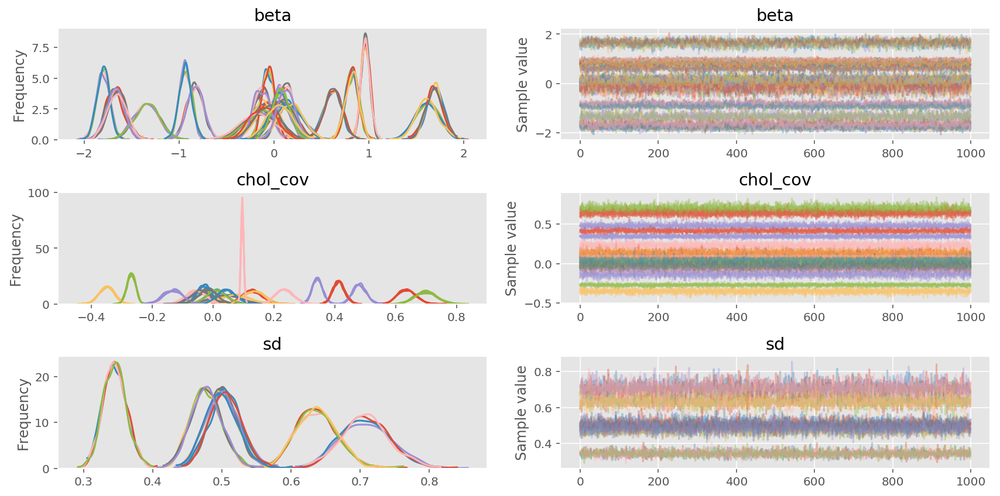

In [25]:
pm.traceplot(tracez, varnames=['beta', 'chol_cov', 'sd']);

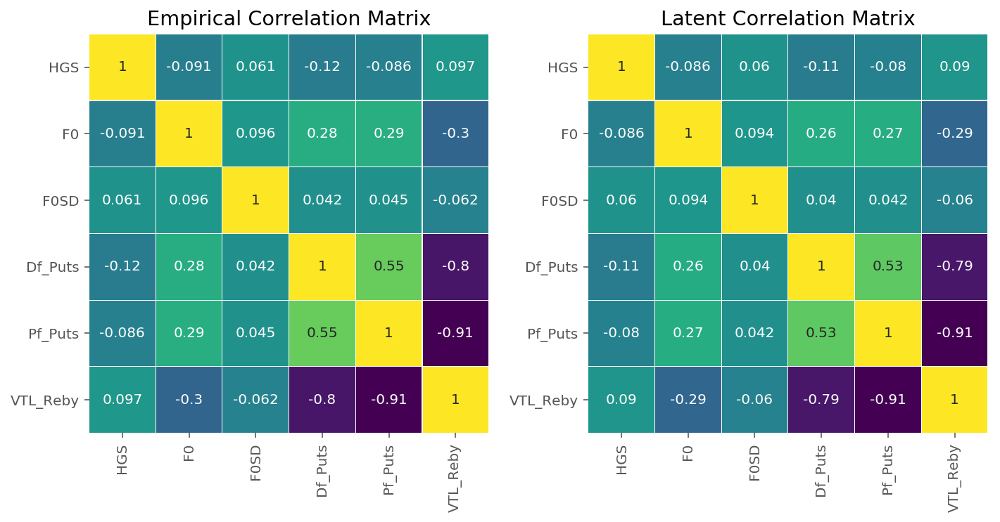

In [26]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(tracez['corr'].mean(axis=0),
                              columns=measure_labels,
                              index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

### Posterior distribution of the cross correlation
Similar conclusion to the paper could be drawn: the posterior distributions of the correlations overlap with zero.

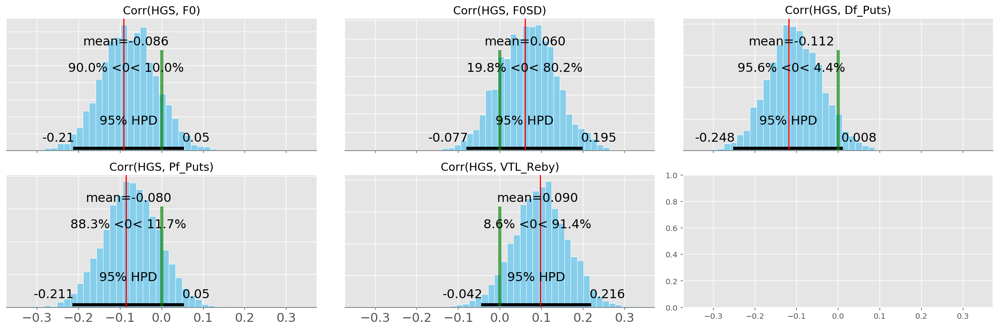

In [27]:
plotpost = pm.plots.artists.plot_posterior_op

_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = tracez['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', 
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].axvline(empirical_corr.values[0, i], color='r')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

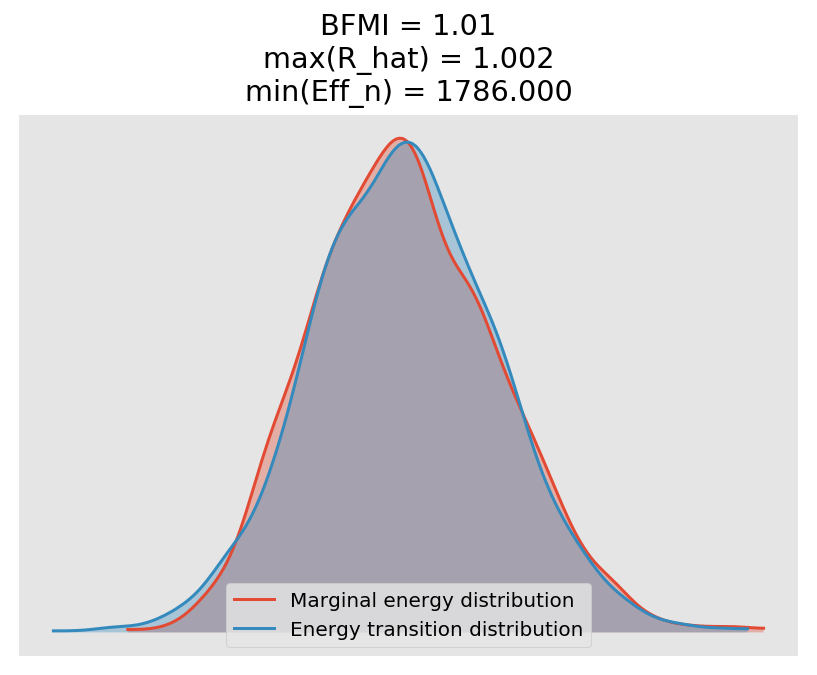

In [28]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))

bfmi, max_gr, min_effn = get_diags(tracez)
(pm.energyplot(tracez, ax=ax)
   .set_title(CONVERGENCE_TITLE()));

## Compare with a bootstrap distribution from a frequentist estimator

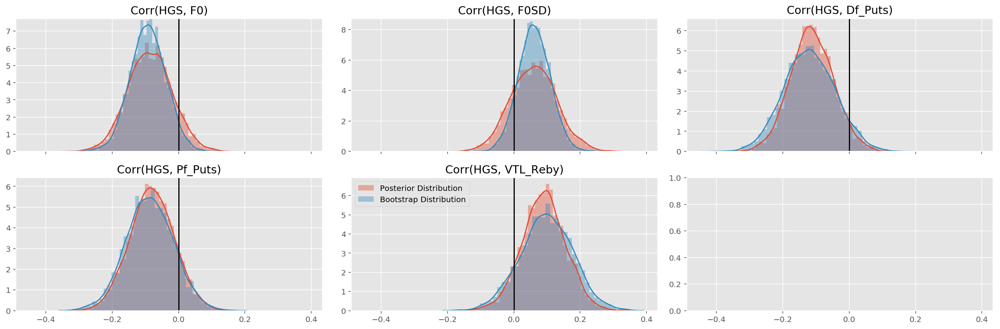

In [29]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        val1 = tracez['corr'][:, 0, i]
        sns.distplot(val1, kde=True, ax=ax1[i-1],
                         label='Posterior Distribution')
        val2 = corr_boot[:, 0, i]
        sns.distplot(val2, kde=True, ax=ax1[i-1],
                         label='Bootstrap Distribution')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
        ax1[i-1].axvline(0, color='k')
ax1[i-1].legend()
plt.tight_layout();